<a href="https://colab.research.google.com/github/Alexher90/An-lisis-de-Datos-2/blob/master/Solucion_Grupo11_Semana7_TransferLearning_Actividad_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## MIIA-4203 MODELOS AVANZADOS PARA ANÁLISIS DE DATOS II


# Aprendizaje por transferencia con redes neuronales 


### Profesor: Camilo Franco (c.franco31@uniandes.edu.co)

En este cuadernos estudiaremos una implementación de aprendizaje por transferencia utilizando la red pre-entrenada VGG-16. Implementaremos nuestra propio modelo de aprendizaje por trasferencia utilizando la biblioteca (API) Keras (https://keras.io/). 

Finalmente evaluaremos si un modelo más complejo de *deep learning* nos permite lograr un mejor desempeño para la detección automática de frailejones sobre imagenes aereas del páramo.

**Presentado por:**

**Alexander Hernández Páez: 200920588**

**Juan David Cortés: 201728568**

**Wilson Felipe González: 200924943**

**Alexander Camargo: 200911325**

Primero importemos algunos de los paquetes que vamos a utilizar, junto con las imagenes de entrenamiento:


In [ ]:
import numpy as np
import h5py
import matplotlib.pyplot as plt
import tensorflow

from ImportImagenesRGB import *
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix 

%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

from prettytable import PrettyTable
import datetime

import keras
from keras.models import Sequential, load_model
from keras.optimizers import SGD
from keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense
from keras import applications

from numpy.random import seed
seed(1)
#from tensorflow import *
#tensorflow.random.set_seed(1)

from numpy.random import seed
seed(1)

In [ ]:
X,Y = import_imagenes_RGB()

print(X.shape, Y.shape, X[0,0,0])

(250, 70, 70, 3) (1, 250) [0.58823529 0.5372549  0.40392157]


**Salida esperada:**

(250, 70, 70, 3) (1, 250) [0.58823529 0.5372549  0.40392157]


## 1. Aprendizaje por transferencia

En pocas palabras, el aprendizaje por transferencia tiene su historia en la psicología, refiriendose a situaciones donde las personas aplican concimiento, estrategias y aptitudes que han aprendido previamente para enfrentar una nueva situación bajo un contexto **relacionado**. Dentro del aprendizaje computacional, este tipo de aprendizaje se enfoca en guardar un tipo de conocimiento que ya se ha mostrado útil para resolver un problema, y aplicarlo para resolver otro problema distinto pero **relacionado**.

Hay que tener en cuenta que si un modelo de transferencia tiene un efecto negativo sobre el desempeño del modelo, entonces tendremos una transferencia negativa (lo cual no es deseable). De este modo, el reto de los métodos de transferencia es el de producir una transferencia positiva entre tareas apropiadamente relacionadas, evitando transferencias negativas entre tareas poco relacionadas (ver Torrey & Shavlik (2009) Transfer learning). 

El ejemplo que vamos a ver a continuación es un tipo de aprendizaje por transferencia inductivo, característico de las redes neuronales, el cual se ajusta de acuerdo con la coincidencia de un conocimiento previo sobre la fuente de información y la tarea que se propone solucionar. En particular, vamos a llevar a cabo un *aprendizaje por transferencia inductivo-jerárquico*, buscando soluciones a tareas sencillas mediante la combinación de herramientas desarrolladas para tareas más complejas. Entonces, usamos el aprendizaje de una red pre-entrenada, la VGG-16, para aprovechar su conocimiento sobre formas, contornos, bordes, etc. que podemos hacer propias para terminar de entender mejor el problema de clasificación de frailejones, y esperamos mejorar el desempeño de los modelos.


### VGG-16

La red VGG-16 fue propuesta por Simonyan & Zisserman (2015) en Very deep CNN for large-scale image recognition, siguiendo los principios presentados en Ciresan et al. (2011): Flexible, High Performance Convolutional Neural Networks for Image Classification.

La arquitectura de la VGG-16 le permitió ganar la competición ILSVR(Imagenet) 2014 (http://www.image-net.org/challenges/LSVRC/2014/results). Los principios de esta arquitectura consisten en considerar filtros convolucionales pequeños (de $3\times 3$), que recorren las imagenes exhaustivamente, con un *stride* de 1, y capas de *max-poling* de $2\times 2$, reduciendo en gran medida el número de hiper-parámetros a optimizar. La red VGG-16 es bastante profunda, con una configuración de 16 capas (con aprox. 138 millones de parámetros): para las primeras 14 capas combina capas convolucionales y capas de agregación, y al final tiene 2 capa densamente conectadas seguidas de una capa de salida *softmax* para clasificación de múltiples clases (ver: https://neurohive.io/en/popular-networks/vgg16/).


Implementemos nuestro ejemplo de aprendizaje por transferencia utilizando la red VGG-16, la cual ha sido entrenada previamente con imagenes RGB y que podemos descargar directamente de Keras:

In [ ]:
model0   = applications.VGG16(include_top=False, weights='imagenet')
config_transI = model0.get_config()

58892288/58889256 [==============================] - 1s 0us/step


Pasamos nuestro conjunto de datos por la red, obteniendo los nuevos patrones de acuerdo con el entendimiento de la red convolucional VGG-16 acerca de las nociones más básicas que encuentra en nuestras imagenes del Páramo:

In [ ]:
feat_X = model0.predict(X)

Agregamos unas pocas capas finales para afinar el modelo por transferencia para la tarea específica de detección de imagenes aereas del Páramo:

In [ ]:
#inicializacion Normal
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

model = Sequential()  
model.add(Flatten(input_shape=feat_X.shape[1:]))  
model.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = model.get_config()

Y entrenamos esas capas finales:

In [ ]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_partseed='+str(r)+'.h5')
        print(pathr)
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))

    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Transfer_Adam_partseed=3.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Transfer_Adam_partseed=1.h5


RuntimeError: ignored

Graficamos el desempeño del modelo:

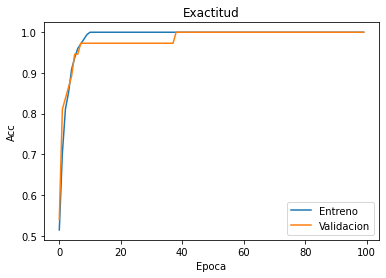

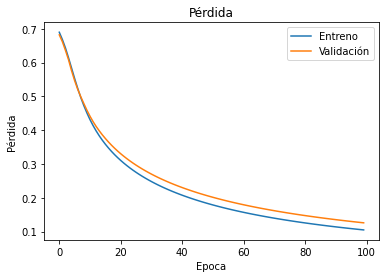

In [ ]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

Cargamos el mejor modelo y confirmamos el desempeño del modelo sobre todo el conjunto de datos:

In [ ]:
# red convolucional
model_4 = load_model('Transfer_Adam_partseed=1.h5')

model_4.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 5)                 10245     
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 6         
Total params: 10,251
Trainable params: 10,251
Non-trainable params: 0
_________________________________________________________________


Veamos el desempeño del mejor modelo sobre todo el conjunto de datos:

In [ ]:
Y_pred = model_4.predict(feat_X)
Y_preds = (Y_pred > 0.5)

confusion_matrix(Y.T, Y_preds)

array([[144,   1],
       [  0, 105]])

**Salida esperada:**
    
<table style="width:20%">
    <tr>
       <td> 144 </td>
       <td> 1 </td>
    </tr>
    <tr>
       <td> 0 </td>
       <td> 105 </td>
    </tr>

</table>

Podemos observar que el desempeño del modelo a mejorado bastante. 

### Ejercicio 1.1

Encuentre el mejor modelo examinando una configuración distinta para las capas de salida, o siguiendo alguna otra estrategia como puede ser cambiando el optimizador o las funciones de activación.

**Escenario 1:**

**Cambiamos el optimizador de Adam por el de RMSProp e iteramos con el Learning Rate y luego con el RHO.**

**También dejamos de iterar con la semilla y la dejamos fija en 2 debido a que luego de ver los resultado con el optimizador de Adam, vimos que la iteración sobre la semilla no generaba mejores resultados.**

In [ ]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Inicializamos el error 
err_p = 999

for i in range(8,20,1):
    r = i/100000
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = 2)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = 2)

    # Definimos los parametros del RMSProp
    rmsprop = keras.optimizers.RMSprop(lr=r, rho=0.9)

    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=rmsprop, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_RMSprop_partseed='+str(r)+'.h5')
        print(pathr)
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))

    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Transfer_RMSprop_partseed=8e-05.h5
Epoca= 99 , accu_v1=0.8918918967247009 , accu_v2=0.8157894611358643
Transfer_RMSprop_partseed=9e-05.h5
Epoca= 99 , accu_v1=0.9189189076423645 , accu_v2=0.8157894611358643
Transfer_RMSprop_partseed=0.0001.h5
Epoca= 99 , accu_v1=0.9189189076423645 , accu_v2=0.8157894611358643
Transfer_RMSprop_partseed=0.00011.h5
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.8157894611358643
Transfer_RMSprop_partseed=0.00012.h5
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.8157894611358643
Transfer_RMSprop_partseed=0.00013.h5
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.00014.h5
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.00015.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.00016.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8157894611358643
Transfer_RMSprop_partseed=0.00017.h5
Epoca= 99 , accu_v1=0.9

In [ ]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Inicializamos el error 
err_p = 999

for i in range(0,10,1):
    r = i/10
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = 2)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = 2)

    # Definimos los parametros del RMSProp
    rmsprop = keras.optimizers.RMSprop(lr=0.00015, rho=r)

    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=rmsprop, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_RMSprop_partseed='+str(r)+'.h5')
        print(pathr)
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))

    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Transfer_RMSprop_partseed=0.0.h5
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.7894737124443054
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.7894737124443054
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.7894737124443054
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.7894737124443054
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.5.h5
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.6.h5
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.7.h5
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.8.h5
Epoca= 99 , accu_v1=0.9459459185600281 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.9.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.7894737124443054
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  0.96  | 

In [ ]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Inicializamos el error 
err_p = 999

for i in range(0,10,1):
    r = (i+90)/100
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = 2)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = 2)

    # Definimos los parametros del RMSProp
    rmsprop = keras.optimizers.RMSprop(lr=0.00015, rho=r)

    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=rmsprop, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_RMSprop_partseed='+str(r)+'.h5')
        print(pathr)
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))

    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Transfer_RMSprop_partseed=0.9.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.91.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.92.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.93.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.94.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.95.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.7894737124443054
Transfer_RMSprop_partseed=0.96.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8157894611358643
Transfer_RMSprop_partseed=0.97.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8157894611358643
Transfer_RMSprop_partseed=0.98.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8421052694320679
Transfer_RMSprop_partseed=0.99.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=

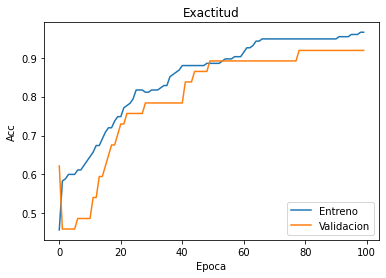

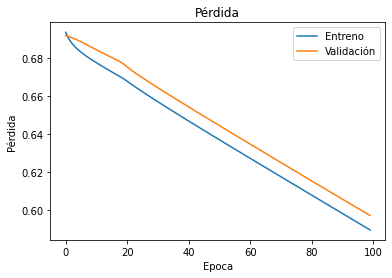

In [ ]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

**Conclusiones escenario 1:**

**Luego de iterar con el Learning Rate y con el RHO, vimos que los mejores resultados se dieron con un LR de 0.0015 y un RHO de 0.9.**

**Al aumentar el valor del Learning Rate, nos dimos cuenta que los resultados no mejoraban, es por esto que lo dejamos con un valor de 0.0015. Por otro lado, luego de hacer varios ensayos, los RHO inferiores a 0.9 no mejoran los resultados, y los RHO entre 0.9 y 0.99 no cambian los resultados de manera significativa.**

**Escenario 2:**

**Ahora usamos el optimizador SGD, iterando de forma similar al escenario 1:**

In [ ]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Inicializamos el error 
err_p = 999

for i in range(0,10,1):
    r = (i)/100
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = 2)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = 2)
    
    # Definimos los parametros del SGD
    sgd = SGD(lr=r, momentum=0.001)

    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=sgd, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_SGD_lr_='+str(r)+'.h5')
        print(pathr)
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))

    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Transfer_SGD_lr_=0.0.h5
Epoca= 0 , accu_v1=0.5405405163764954 , accu_v2=0.3947368562221527
Transfer_SGD_lr_=0.01.h5
Epoca= 0 , accu_v1=0.45945945382118225 , accu_v2=0.6052631735801697
Transfer_SGD_lr_=0.02.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8421052694320679
Transfer_SGD_lr_=0.03.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8684210777282715
Transfer_SGD_lr_=0.04.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Transfer_SGD_lr_=0.05.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Transfer_SGD_lr_=0.06.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Transfer_SGD_lr_=0.07.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Transfer_SGD_lr_=0.09.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+----

In [ ]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Inicializamos el error 
err_p = 999

for i in range(0,10,1):
    r = (i)/10
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = 2)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = 2)
    
    # Definimos los parametros del SGD
    sgd = SGD(lr=0.02, momentum=r)

    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=sgd, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_SGD_lr_='+str(r)+'.h5')
        print(pathr)
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))

    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Transfer_SGD_lr_=0.0.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8421052694320679
Transfer_SGD_lr_=0.1.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8684210777282715
Transfer_SGD_lr_=0.2.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8684210777282715
Transfer_SGD_lr_=0.3.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8421052694320679
Transfer_SGD_lr_=0.4.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8947368264198303
Transfer_SGD_lr_=0.5.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.8947368264198303
Transfer_SGD_lr_=0.6.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Transfer_SGD_lr_=0.7.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Transfer_SGD_lr_=0.8.h5
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+--

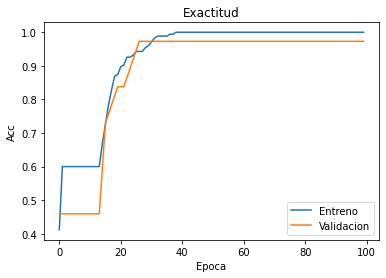

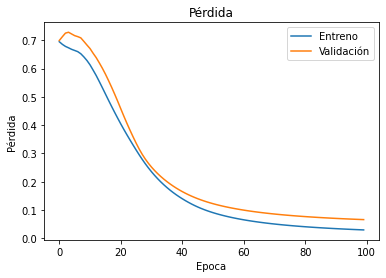

In [ ]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

**Conclusión escenario 2:**

**Para**

**Luego de iterar con el Learning Rate y con el momentum, vimos que los mejores resultados se dieron con un LR de 0.02 y con momentum de 0.6.**

**Escenario 3:**

**En este escenario, incluimos una capa con 5 nodos, activación relu y con una inicialización He.**

In [ ]:
#inicializaciones:
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)
initHe = keras.initializers.he_normal(seed=1)


model = Sequential()  
model.add(Flatten(input_shape=feat_X.shape[1:]))  
model.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
model.add(Dense(5, activation='relu', kernel_initializer=initHe, bias_initializer='zeros')) 
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = model.get_config()

In [ ]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_partseed1='+str(r)+'.h5')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))

    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9473684430122375
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  1.0   | 0.973  | 0.9474 |   99  |
|  1.0   | 0.973  | 0.9211 |   99  |
+--------+--------+--------+-------+


**Conclusión general:**

**Luego de probar con otros optimizadores y agregando una capa extra, encontramos que el mejor resultado lo otorgó el optimizador Adam al agregar una capa extra con 5 nodos y con activación relu, la cual inicializamos con He.**

## 2. Caso aplicado

Ahora probemos nuestro modelo sobre la imagen completa de prueba del paramo ``IMG_3451.JPG``.


In [ ]:
from keras.preprocessing import *

img = image.load_img('IMG_3451.JPG')

### 2.1 Red sencilla

In [ ]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])
Acc_E = []
Acc_V = []
Acc_P = []

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=1000

# Definimos los parametros del SGD
sgd = SGD(lr=0.01, momentum=0.001)
# junto con la inicialización aleatoria
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

# inicializamos el error para guardar el mejor modelo
err_p = 999
  
# implementamos 3 repeticiones con particiones distintas de entrenamiento y doble validacion
for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Especificamos la arquitectura de la red 
    model = Sequential()  
    model.add(Flatten(input_shape=CE_x.shape[1:]))
    model.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))
    model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=sgd, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False) 
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
            
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('modelo_redsencilla_initseed=1_part_seed='+str(r)+'numn=5.h5')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' y accu_v='+str(accu_v))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])
    
    # Exactitud media
    Acc_E.append(accu_e)
    Acc_V.append(accu_v)
    Acc_P.append(accu_p)

print(x)

print('Accuracies de Entrenamiento: '+str(np.round(np.mean(Acc_E),3))
      +'; Validacion1: '+str(np.round(np.mean(Acc_V),3))+ '; Validacion2: '+str(np.round(np.mean(Acc_P),3)))

Epoca= 764 y accu_v=0.7837837934494019


KeyboardInterrupt: ignored

In [ ]:
# red sencilla 5 neuronas
model_1 = load_model('modelo_redsencilla_initseed=1_part_seed=3numn=5.h5')

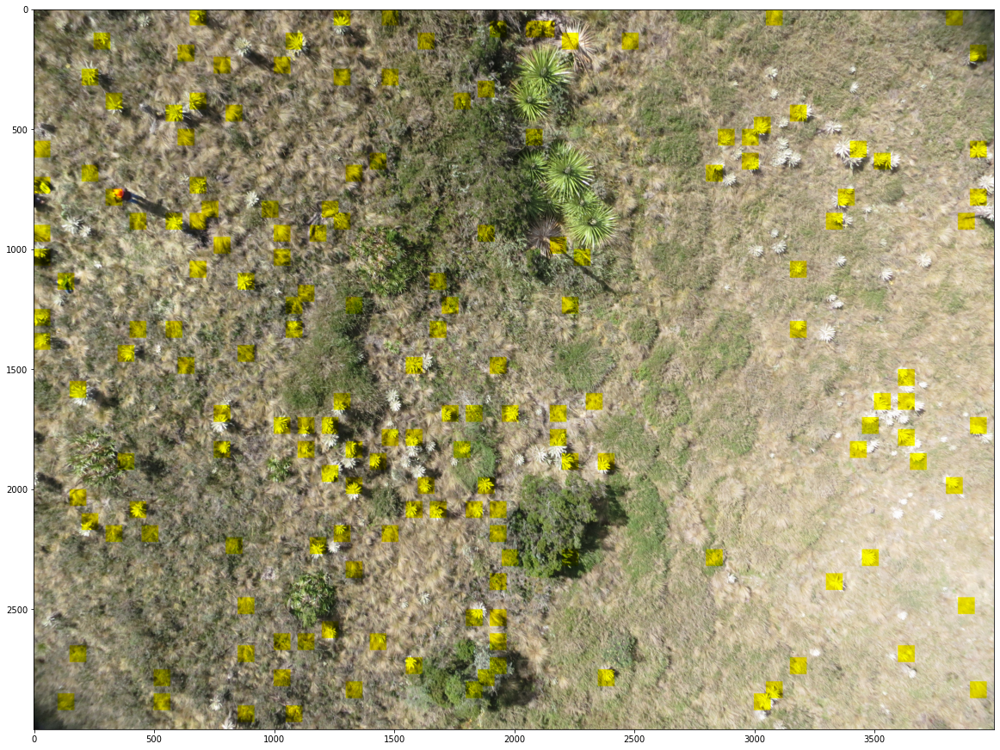

In [ ]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        Y_preds = model_1.predict(subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### 2.2 Red multi-capa

In [ ]:
model = Sequential()  
model.add(Flatten(input_shape=X.shape[1:]))
model.add(Dense(700, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))  
model.add(Dense(400, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(100, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(50, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(15, activation='relu', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 
    
# Guardamos la arquitectura de red
config_norm = model.get_config()

In [ ]:
model = Sequential()   
model.add(Flatten(input_shape=X.shape[1:]))
model.add(Dense(700, activation='relu', kernel_initializer=initHe, bias_initializer='zeros')) 
model.add(Dense(400, activation='relu', kernel_initializer=initHe, bias_initializer='zeros'))
model.add(Dense(100, activation='relu', kernel_initializer=initHe, bias_initializer='zeros'))
model.add(Dense(50, activation='relu', kernel_initializer=initHe, bias_initializer='zeros'))
model.add(Dense(15, activation='relu', kernel_initializer=initHe, bias_initializer='zeros'))
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 
    
# Guardamos la arquitectura de red
config_He = model.get_config()

Inicio Init=Normal:2020-10-04 23:13:28.763761
Epoca= 186 , accu_v1=0.8648648858070374 , accu_v2=0.8421052694320679
Fin Init= Normal:2020-10-04 23:17:43.156749


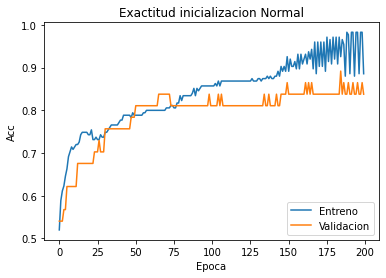

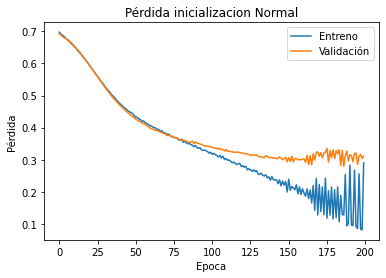

Inicio Init=He:2020-10-04 23:17:43.783083
Epoca= 177 , accu_v1=0.8648648858070374 , accu_v2=0.7894737124443054
Fin Init= He:2020-10-04 23:21:51.884304


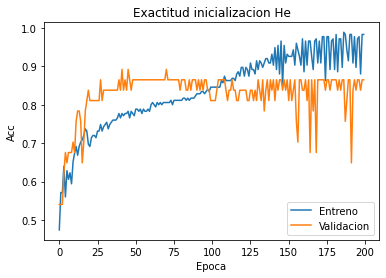

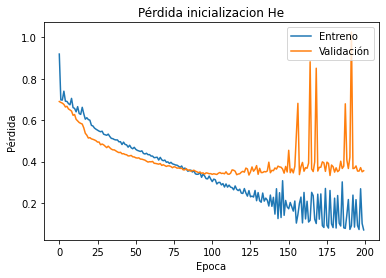

+--------+--------+--------+-------+--------+
| Exac_E | Exac_V | Exac_P | Epoca |  Init  |
+--------+--------+--------+-------+--------+
|  1.0   | 0.8649 | 0.8421 |  186  | Normal |
| 0.9829 | 0.8649 | 0.7895 |  177  |   He   |
+--------+--------+--------+-------+--------+


In [ ]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca", "Init"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=200

# Definimos los parametros del RMSProp
rmsprop = keras.optimizers.RMSprop(lr=0.00008, rho=0.9)

# implementamos 2 repeticiones, una con inicializacion aleatoria Normal y otra con He
for i in range(2):
    if(i==0):
        model = Sequential.from_config(config_norm)
        init = "Normal"
        tiempo0 = datetime.datetime.now()
        print('Inicio Init=' +str(init)+':' +str(tiempo0))
    elif(i==1):
        model = Sequential.from_config(config_He)
        init = "He"
        tiempo0 = datetime.datetime.now()
        print('Inicio Init=' +str(init)+':' +str(tiempo0))
        
    # Partimos los datos en entrenamiento y doble validación
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(X, Y.T, test_size = 0.3, random_state = 8)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = 8)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=rmsprop, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)  
  
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en la primera validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
           
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    pathr =('modelo_redprofunda_initseed=1_part_seed=8_Init='+str(init)+'.h5')
    model.save(pathr) 
    err_p = loss_p
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0], init])
    
    # Imprimimos el desempeño para cada inicializacion y el tiempo en completar las iteraciones
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    tiempo1 = datetime.datetime.now()
    print('Fin Init= ' +str(init)+':' +str(tiempo1))
    
    # Graficamos el desempeño del modelo
    plt.figure(1)
    plt.plot(history.history['accuracy'])  
    plt.plot(history.history['val_accuracy'])  
    plt.title('Exactitud inicializacion ' +str(init))  
    plt.ylabel('Acc')  
    plt.xlabel('Epoca')  
    plt.legend(['Entreno', 'Validacion'], loc='lower right')
    plt.show()

    plt.figure(1) 
    plt.plot(history.history['loss'])  
    plt.plot(history.history['val_loss'])  
    plt.title('Pérdida inicializacion ' +str(init))  
    plt.ylabel('Pérdida')  
    plt.xlabel('Epoca')  
    plt.legend(['Entreno', 'Validación'], loc='upper right')  
    plt.show()

print(x)

In [ ]:
# red profunda de 6 capas
model_2 = load_model('modelo_redprofunda_initseed=1_part_seed=8_Init=Normal.h5')

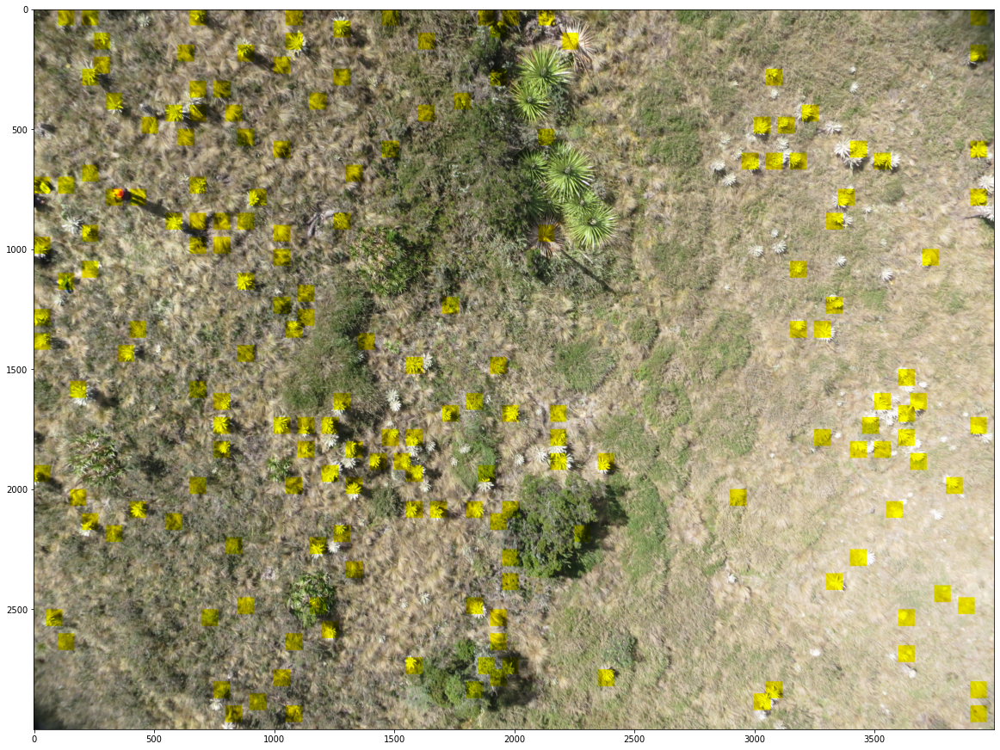

In [ ]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        Y_preds = model_2.predict(subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### 2.3 Red Convolucional

In [ ]:
#inicializacion Normal
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

# Inicializacion de He
initHe = keras.initializers.he_normal(seed=1)

# Arquitectura de la red
model = Sequential()  
model.add(Conv2D(32, (3, 3), input_shape=X.shape[1:], activation='tanh', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(MaxPooling2D(pool_size=(2, 2))) 
model.add(Conv2D(32, (3, 3), activation='tanh', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation='selu', kernel_initializer=initHe, bias_initializer='zeros'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(64, activation='relu', kernel_initializer=initHe, bias_initializer='zeros'))
model.add(Dropout(rate=0.2, seed=1))   
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 
    
# Guardamos la arquitectura de red
config_cnn = model.get_config()

In [ ]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)

# Inicializamos el error 
err_p = 999

# implementamos 3 repeticiones con particiones distintas de entrenamiento y doble validacion
for i in range(0,3,1):
    r = i^3
    print(r)
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)

    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_cnn)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
       
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    ## Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('modelo_CNN_initseed=1_part_seed='+str(r)+'.h5')
        model.save(pathr) 
        err_p = loss_p

    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

3
Epoca= 14 , accu_v1=0.837837815284729 , accu_v2=0.8684210777282715
2


RuntimeError: ignored

In [ ]:
# red convolucional sencilla
model_3 = load_model('modelo_CNN_initseed=1_part_seed=3.h5')

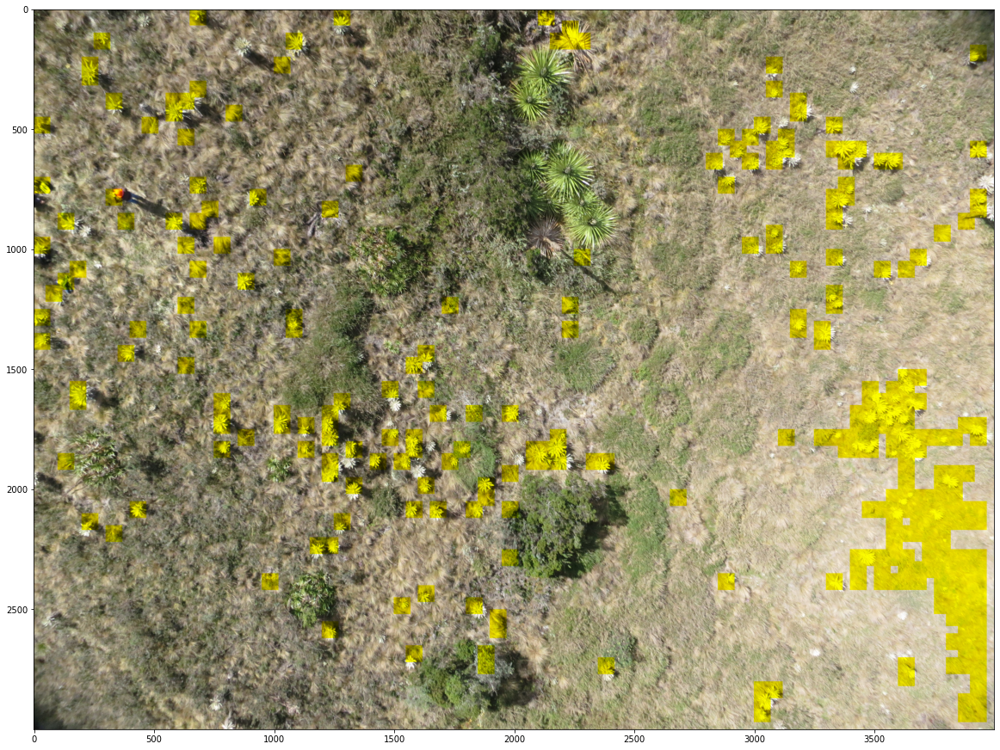

In [ ]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        Y_preds = model_3.predict(subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### 2.4 Red Convolucional VGG-16 con transferencia

In [ ]:
# red convolucional
model_4 = load_model('Transfer_Adam_partseed1=3.h5')

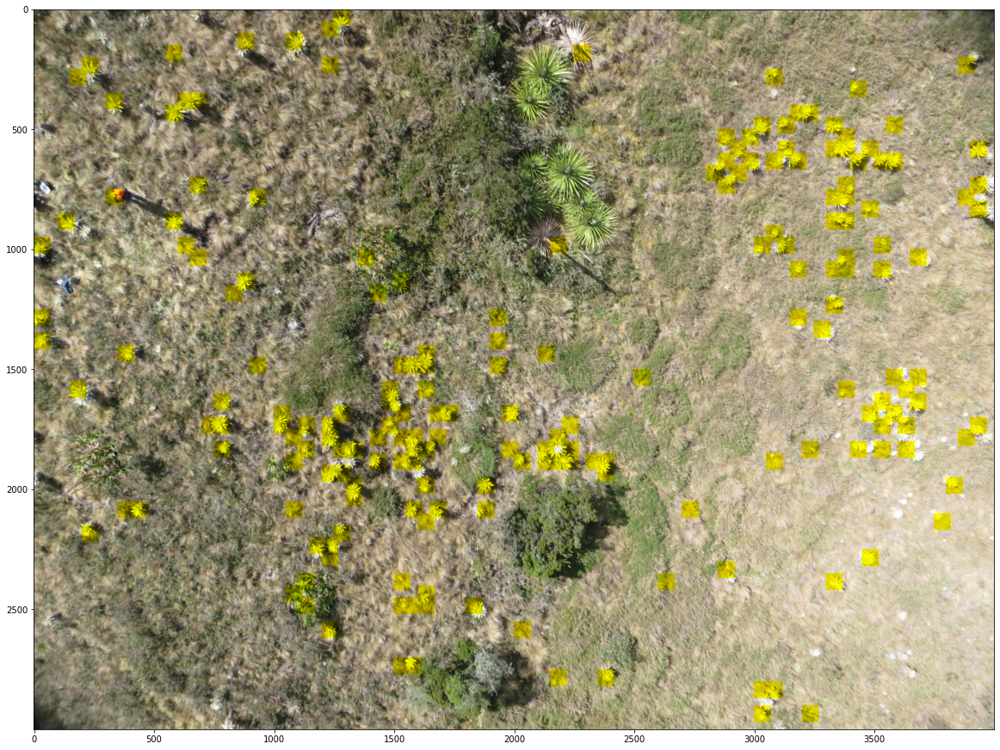

In [ ]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        feat_subi2 = model0.predict(subi2)
        Y_preds = model_4.predict(feat_subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### Pregunta 2.1

¿Qué puede observar sobre el desempeño de los diferentes modelos? Argumente cuál es el mejor modelo para poner en producción.

**Según los resultados de las validaciones generadas en los diferentes modelos, junto con los diferentes parámetros implementados, podemos concluir que el modelo construido en el *escenario 3* por el grupo de trabajo obtuvo un mejor desempeño comparando los índices generados de los accuracies de los modelos.**

**En este escenario utilizamos el inicializador Adam y contrario a lo expuesto en el código inicial, adicionamos una capa de 5 nodos con activación relu e inicializador He.**

### Ejercicio 2.2

Investigue otra red pre-entrenada dsitinta a la VGG-16 e implemente el aprendizaje por transferencia para la deteccion de frailejones. Argumente por qué su justifica el aprendizaje por transferencia con base en el modelo pre-entrenado de su elección (cómo se relacionan la tarea base y la segunda tarea objetivo).

**Con el fin de probar otra red pre entrenada diferente a la VGG 16, consultamos en el siguiente link: https://keras.io/api/applications/. Inicialmente probamos la ResNet50, encontrando que no arroja resultados satisfactorios.**

In [ ]:
model_0   = applications.ResNet50(include_top=False, weights='imagenet')
config_transI = model_0.get_config()

94773248/94765736 [==============================] - 1s 0us/step


In [ ]:
feat_X = model_0.predict(X)

In [ ]:
#inicializaciones:
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)
initHe = keras.initializers.he_normal(seed=1)


model = Sequential()  
model.add(Flatten(input_shape=feat_X.shape[1:]))  
model.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
model.add(Dense(5, activation='relu', kernel_initializer=initHe, bias_initializer='zeros')) 
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = model.get_config()

In [ ]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_partseed1='+str(r)+'.h5')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))

    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Epoca= 99 , accu_v1=0.7837837934494019 , accu_v2=0.8157894611358643
Epoca= 0 , accu_v1=0.45945945382118225 , accu_v2=0.6052631735801697
Epoca= 8 , accu_v1=0.5405405163764954 , accu_v2=0.6315789222717285
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
| 0.9771 | 0.7838 | 0.8158 |   99  |
|  0.6   | 0.4595 | 0.6053 |   0   |
| 0.5771 | 0.5405 | 0.6316 |   8   |
+--------+--------+--------+-------+


**Teniendo en cuenta que el ResNet50 no arrojó buenos resultados, procedimos a probar con MobileNetV2, el cual tampoco generó resultados satisfactorios:**

**Es de anotar que se probó la VGG 19, encontrando que arrojó los mismos resultados de la VGG 16.**

In [ ]:
model_0   = applications.MobileNetV2(include_top=False, weights='imagenet')
config_transI = model_0.get_config()

9412608/9406464 [==============================] - 0s 0us/step


In [ ]:
#inicializaciones:
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)
initHe = keras.initializers.he_normal(seed=1)


model = Sequential()  
model.add(Flatten(input_shape=feat_X.shape[1:]))  
model.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
model.add(Dense(5, activation='relu', kernel_initializer=initHe, bias_initializer='zeros')) 
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = model.get_config()

In [ ]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Inicializamos el error 
err_p = 999

for i in range(0,10,1):
    r = i/1000
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = 2)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = 2)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)

    # Definimos los parametros del Adam
    adam = keras.optimizers.Adam(lr=i, beta_1=0.9, beta_2=0.999)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_partseed1='+str(r)+'.h5')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))

    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

Epoca= 0 , accu_v1=0.5405405163764954 , accu_v2=0.3947368562221527
Epoca= 1 , accu_v1=0.45945945382118225 , accu_v2=0.6052631735801697
Epoca= 6 , accu_v1=0.45945945382118225 , accu_v2=0.6052631735801697
Epoca= 7 , accu_v1=0.45945945382118225 , accu_v2=0.6052631735801697
Epoca= 7 , accu_v1=0.5405405163764954 , accu_v2=0.3947368562221527
Epoca= 18 , accu_v1=0.5405405163764954 , accu_v2=0.3947368562221527
Epoca= 13 , accu_v1=0.5405405163764954 , accu_v2=0.3947368562221527
Epoca= 11 , accu_v1=0.5405405163764954 , accu_v2=0.3947368562221527
Epoca= 9 , accu_v1=0.5405405163764954 , accu_v2=0.3947368562221527
Epoca= 9 , accu_v1=0.5405405163764954 , accu_v2=0.3947368562221527
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  0.4   | 0.5405 | 0.3947 |   0   |
|  0.6   | 0.4595 | 0.6053 |   1   |
|  0.6   | 0.4595 | 0.6053 |   6   |
|  0.6   | 0.4595 | 0.6053 |   7   |
|  0.4   | 0.5405 | 0.3947 |   7   |
|  0.4   | 0.5405 | 0.3947 |

### Ejercicio 2.3
Construya un algoritmo que utilice el mejor modelo de red neuronal para la detección de poblaciones en la imagen completa IMG_3451.JPG, y estime la densidad para cada población detectada.

*Ayuda:* Mediante un procedimiento sencillo, primero detecte las poblaciones de frailejones y luego estime su densidad, calculada como el numero de frailejones por area poblada.

**Tal como se ha venido comentando en el presente notebook, el modelo construido por el grupo de trabajo fue el que arrojó los mejores resultados de accuracy por cada época implementada.**

**Este modelo contiene como parámetro inicializador Adam, la inclusión de una capa extra de 5 nodos, activador rely e inicializador He y VGG16.**

**Ahora bien, para calcular la densidad, hicimos uso de los contadores n y m para registrar las predicciones de frailejones identificados en estas variables.**

In [ ]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
n=0
m=0
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        feat_subi2 = model0.predict(subi2)
        Y_preds = model_4.predict(feat_subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            n=n+1
        if(pred_P==0):
            m=m+1
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
print(m,n)

4396 265


In [ ]:
densidad=n/(n+m)
print(densidad)

0.056854752199098905
